In [3]:
# 1er CopernicusLAC Hackathon: Reducción del riesgo de desastres
# Proyecto: Monitoreo y Caracterización de Incendios en Colombia: Caso de estudio TOLIMA
# Email de contacto: jorge.alpala@gestiondelriesgo.gov.co
# Integrantes:
# Catalina Franco - Geologa
# Camila Lima - Geologa
# Laura Sanaches - Geologa
# Sandra Mendoza - Geologa
# Sebastian Alvarado - Ingeniero Geologo
# Jorge Alpala - Ingeniero Civil


# Instalación de librerias
!pip install sentinelhub numpy matplotlib

!pip install sentinelhub
!pip show sentinelhub

!python3 -m pip install --upgrade pip
!pip install sentinelhub numpy matplotlib

!pip install geopandas

# Instalación de librería para mapas base
!pip install contextily


Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Name: sentinelhub
Version: 3.11.1
Summary: Python API for Sentinel Hub
Home-page: https://github.com/sentinel-hub/sentinelhub-py
Author: 
Author-email: Sinergise EO research team <eoresearch@sinergise.com>
License: MIT License
        
        Copyright (c) 2018 Sinergise Ltd.
        
        Permission is hereby granted, free of charge, to any person obtaining a copy
        of this software and associated documentation files (the "Software"), to deal
        in the Software without restriction, including without limitation the rights
        to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
        copies of the Software, and to permit persons to whom the Software is
        furnished to do so, subject to the following conditions:
        
        The above copyright notice and this permission notice shall

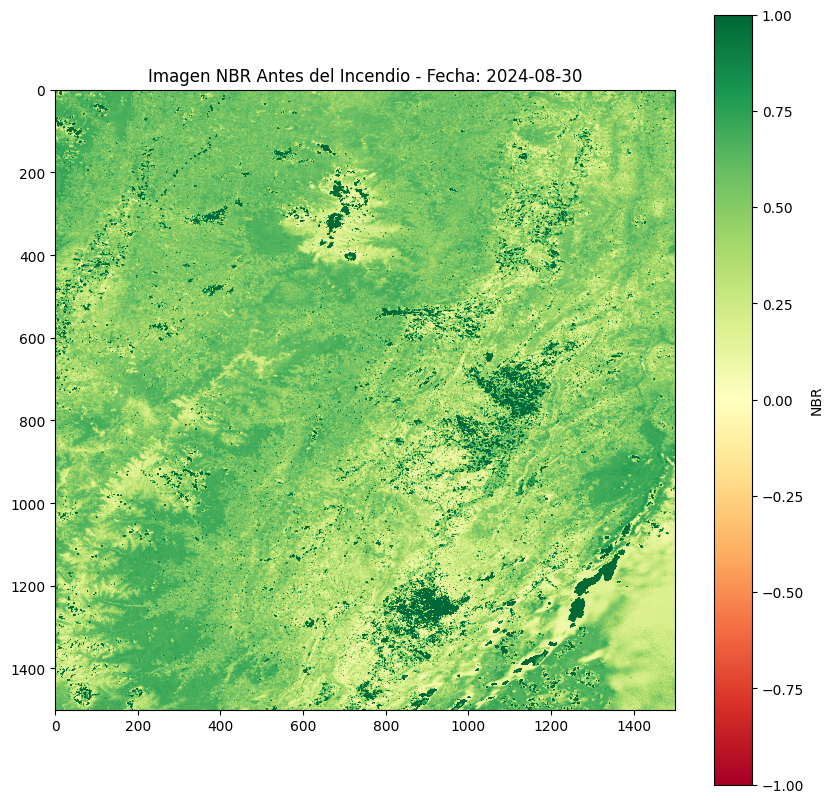

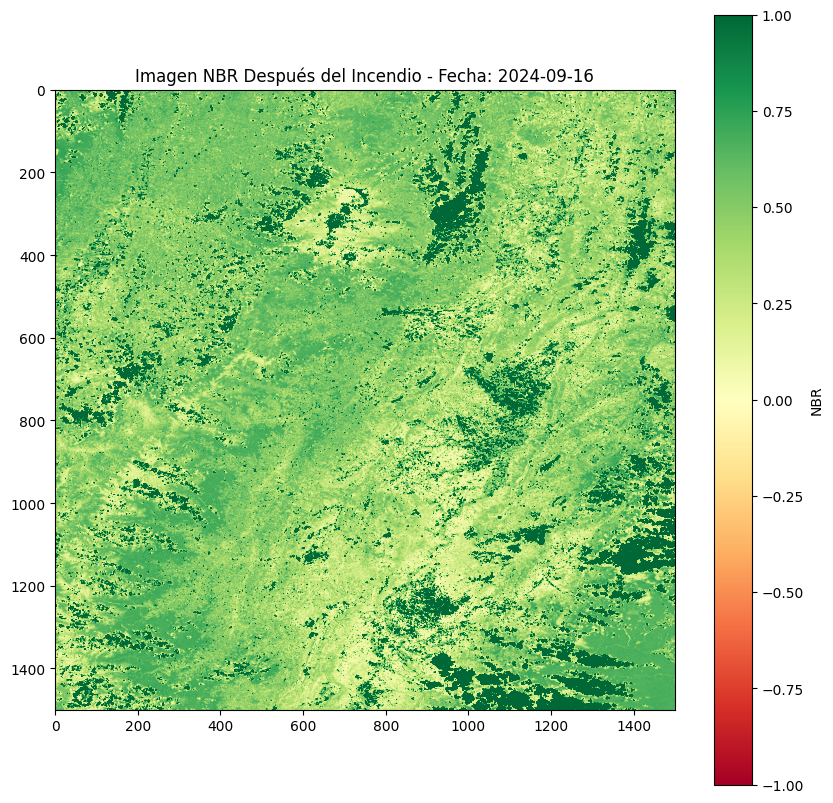

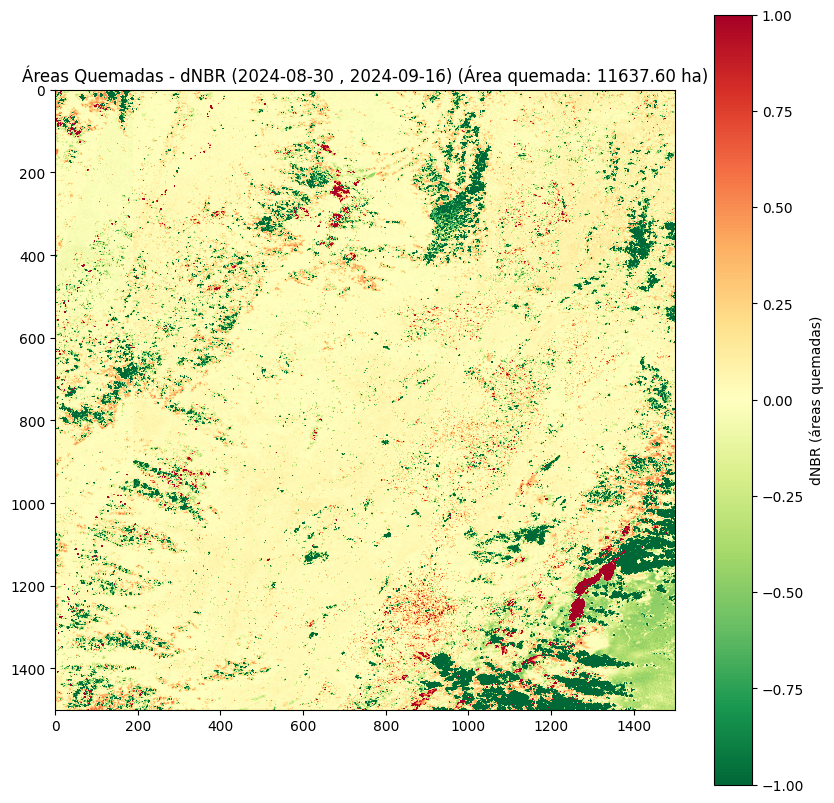

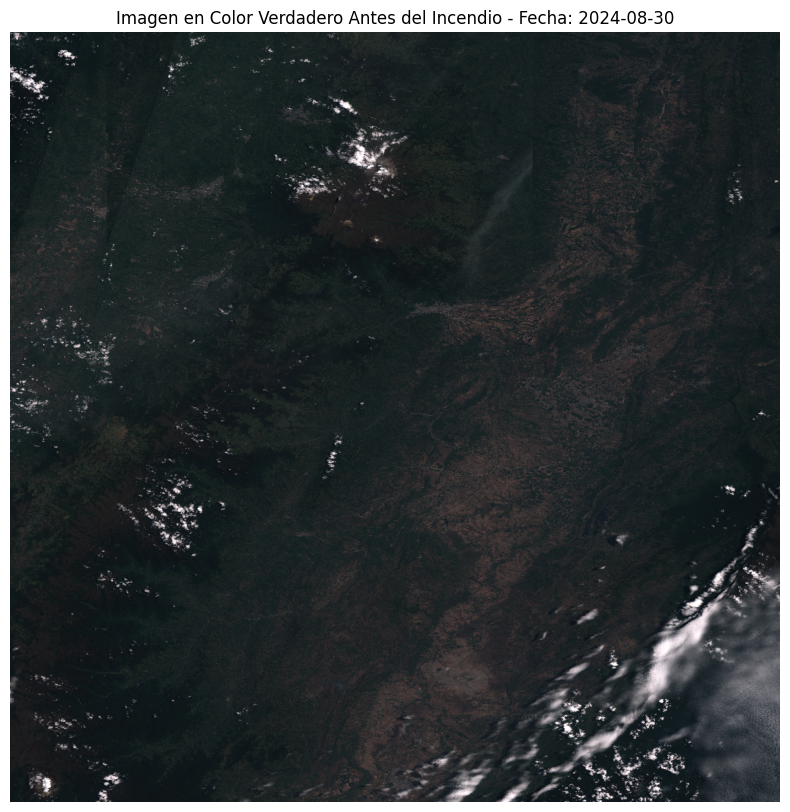

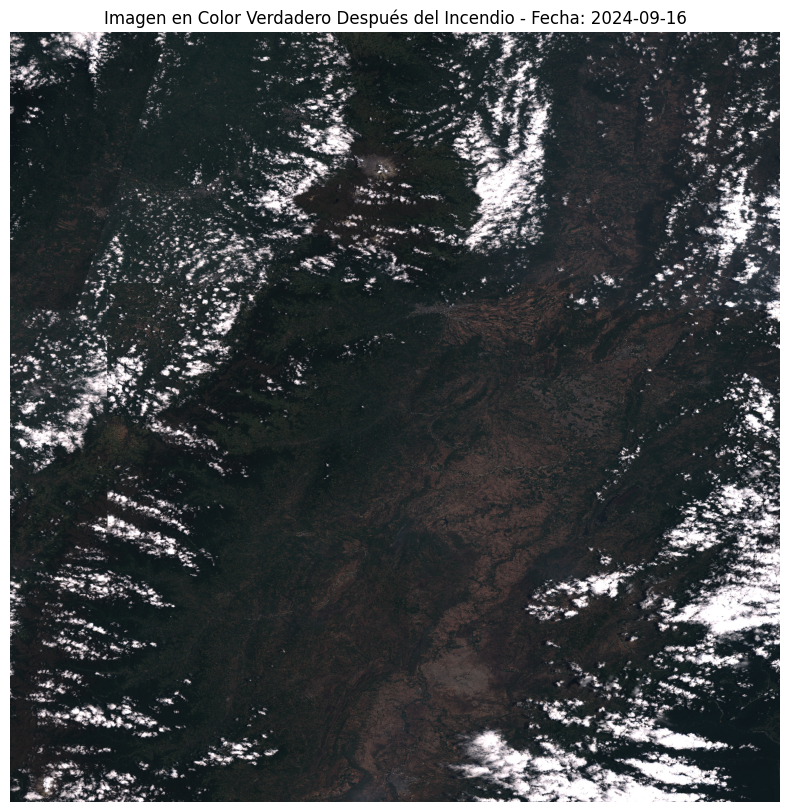

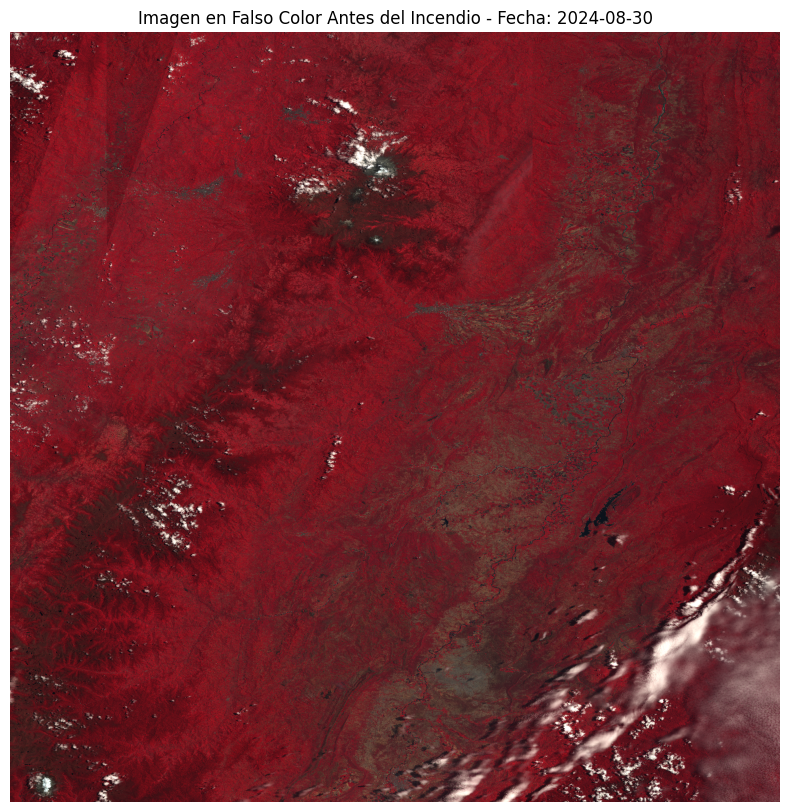

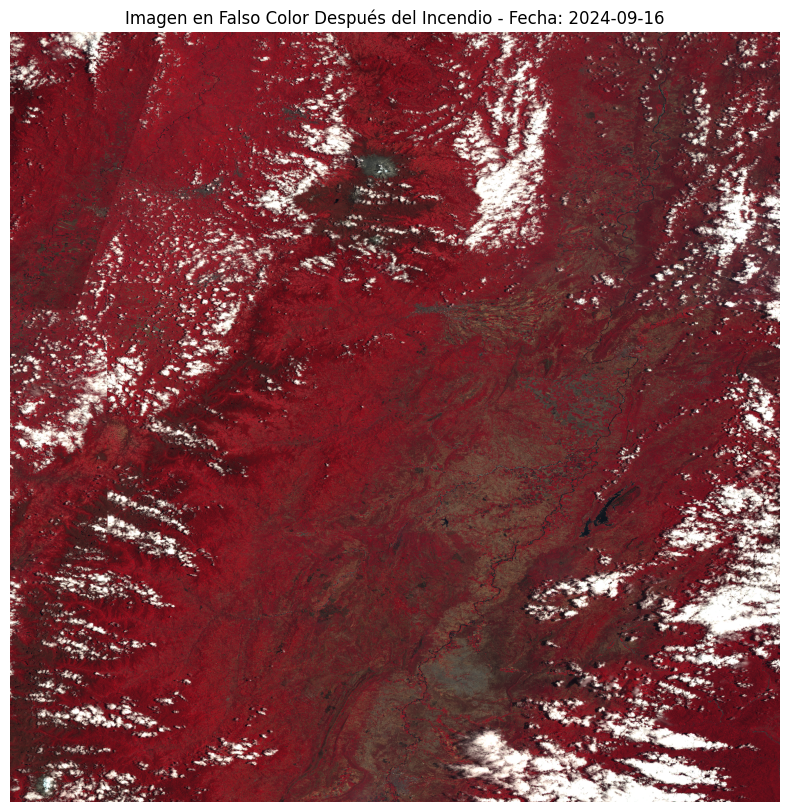

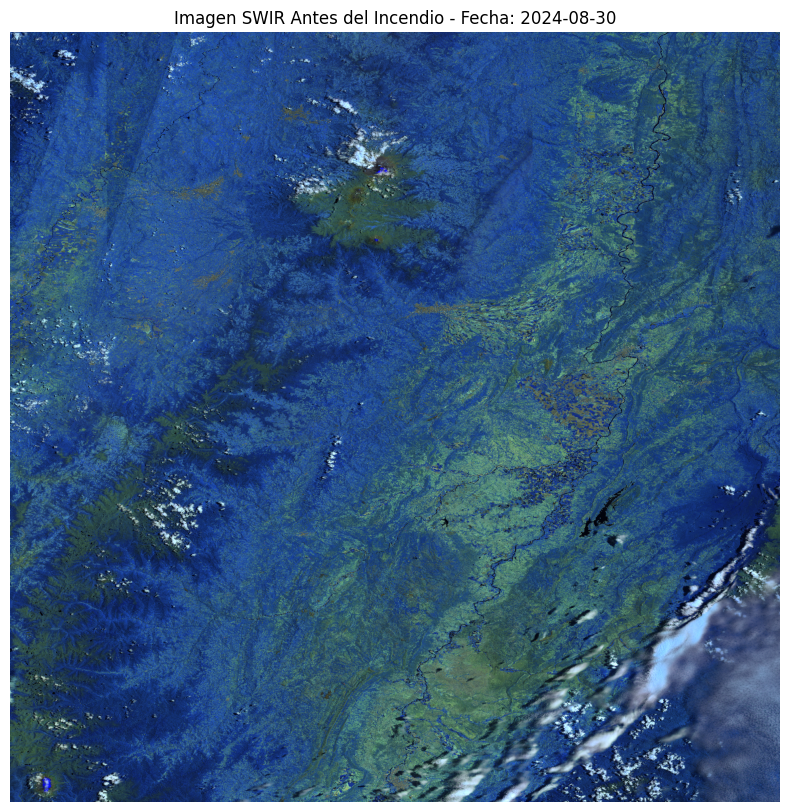

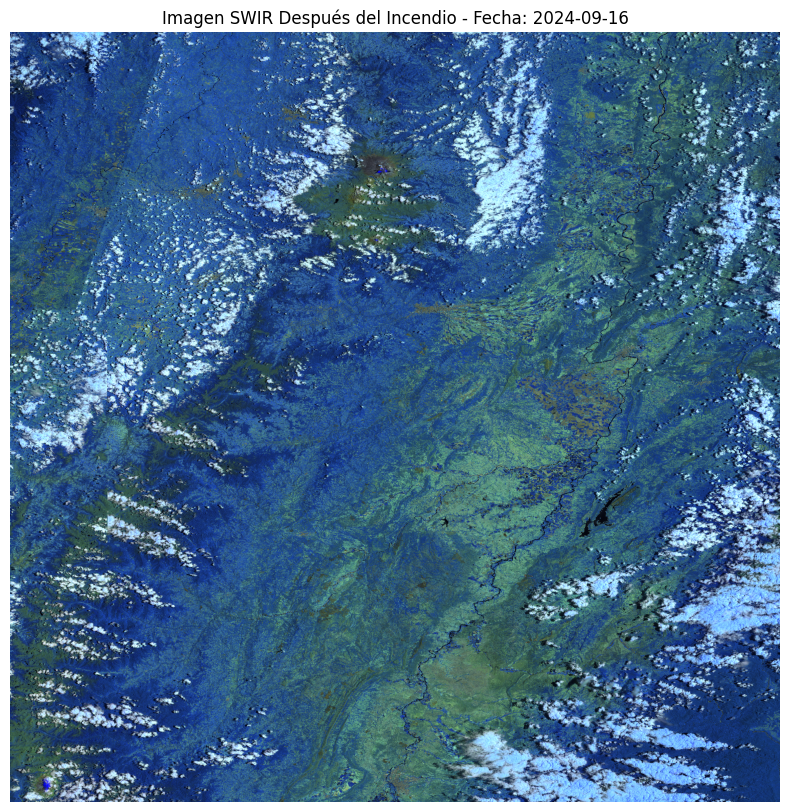

In [5]:
# Codigo para detección de áreas quemadas con Sentinel2

import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
from sentinelhub import SHConfig, MimeType, CRS, BBox, SentinelHubRequest, DataCollection
from shapely.geometry import box  # Importar la función box para crear el polígono del ROI

# Librerias para inteligencia artificial
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Configuración de Sentinel Hub
config = SHConfig()
config.sh_client_id = '363fd74d-87b1-4441-9e38-cff598e86999'
config.sh_client_secret = 'lCPAR0lfVN7vr0y4GXGwe8RFIcFrd9FN'
config.save()

# Leer el archivo shapefile para la región de interés (ROI)
shapefile_path = 'area_estudio.shp'
gdf = gpd.read_file(shapefile_path)

# Asegurarse de que el shapefile esté en el sistema de coordenadas correcto (WGS84)
gdf = gdf.to_crs(epsg=4326)

# Extraer el bounding box de la geometría
minx, miny, maxx, maxy = gdf.total_bounds
roi_bbox = BBox(bbox=(minx, miny, maxx, maxy), crs=CRS.WGS84)

# Crear un polígono del ROI para verificar la intersección
roi_polygon = box(minx, miny, maxx, maxy)

# Rango de fechas ingresado por el usuario
time_interval_before = ('2024-08-15', '2024-08-30')  # Fechas antes del incendio
time_interval_after = ('2024-09-01', '2024-09-16')   # Fechas después del incendio

# Definir el tamaño máximo permitido para la imagen
width, height = 1500, 1500  # Limitar el tamaño de la imagen a 1500x1500 píxeles

# Función para crear una solicitud de imágenes (NBR, RGB, SWIR, Falso color)
def create_request(bbox, time_interval, config):
    # Solicitud para remuestrear B08 a 20m y obtener B12
    request_resampled = SentinelHubRequest(
        data_folder='sentinel_data',
        evalscript="""
        function setup() {
          return {
            input: ["B08", "B12"],
            output: { bands: 2, sampleType: "AUTO" }
          };
        }

        function evaluatePixel(sample) {
          return [sample.B08, sample.B12];
        }
        """,
        input_data=[SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C,
            time_interval=time_interval,
            mosaicking_order='leastCC'
        )],
        responses=[SentinelHubRequest.output_response('default', MimeType.TIFF)],
        bbox=bbox,
        size=(width, height),  # Asegurarse de que ambas bandas estén a 20m
        config=config
    )
    
    # Solicitud RGB
    request_rgb = SentinelHubRequest(
        data_folder='sentinel_data',
        evalscript="""
        function setup() {
          return {
            input: ["B04", "B03", "B02"],
            output: { bands: 3 }
          };
        }

        function evaluatePixel(sample) {
          return [
            sample.B04 * 1.5,  // Ajustar brillo
            sample.B03 * 1.5,  // Ajustar brillo
            sample.B02 * 1.5   // Ajustar brillo
          ];
        }
        """,
        input_data=[SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C,
            time_interval=time_interval,
            mosaicking_order='leastCC'
        )],
        responses=[SentinelHubRequest.output_response('default', MimeType.TIFF)],
        bbox=bbox,
        size=(width, height),
        config=config
    )

    # Solicitud SWIR
    request_swir = SentinelHubRequest(
        data_folder='sentinel_data',
        evalscript="""
        function setup() {
          return {
            input: ["B12", "B11", "B8A"],
            output: { bands: 3 }
          };
        }

        function evaluatePixel(sample) {
          return [
            sample.B12 * 1.5,  // Ajustar brillo
            sample.B11 * 1.5,  // Ajustar brillo
            sample.B8A * 1.5   // Ajustar brillo
          ];
        }
        """,
        input_data=[SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C,
            time_interval=time_interval,
            mosaicking_order='leastCC'
        )],
        responses=[SentinelHubRequest.output_response('default', MimeType.TIFF)],
        bbox=bbox,
        size=(width, height),
        config=config
    )

    # Solicitud Falso Color (B08-B04-B03)
    request_false_color = SentinelHubRequest(
        data_folder='sentinel_data',
        evalscript="""
        function setup() {
          return {
            input: ["B08", "B04", "B03"],
            output: { bands: 3 }
          };
        }

        function evaluatePixel(sample) {
          return [
            sample.B08 * 1.5,  // Ajustar brillo
            sample.B04 * 1.5,  // Ajustar brillo
            sample.B03 * 1.5   // Ajustar brillo
          ];
        }
        """,
        input_data=[SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C,
            time_interval=time_interval,
            mosaicking_order='leastCC'
        )],
        responses=[SentinelHubRequest.output_response('default', MimeType.TIFF)],
        bbox=bbox,
        size=(width, height),
        config=config
    )

    return request_resampled, request_rgb, request_swir, request_false_color

# Crear las solicitudes para antes y después del incendio
requests_before = create_request(roi_bbox, time_interval_before, config)
requests_after = create_request(roi_bbox, time_interval_after, config)

# Ejecutar las solicitudes antes del incendio
response_resampled_before = requests_before[0].get_data(save_data=True)
response_rgb_before = requests_before[1].get_data(save_data=True)
response_swir_before = requests_before[2].get_data(save_data=True)
response_false_color_before = requests_before[3].get_data(save_data=True)

# Ejecutar las solicitudes después del incendio
response_resampled_after = requests_after[0].get_data(save_data=True)
response_rgb_after = requests_after[1].get_data(save_data=True)
response_swir_after = requests_after[2].get_data(save_data=True)
response_false_color_after = requests_after[3].get_data(save_data=True)

# Cargar las bandas B08 y B12 remuestradas antes y después
b08_before = response_resampled_before[0][:, :, 0]
b12_before = response_resampled_before[0][:, :, 1]
b08_after = response_resampled_after[0][:, :, 0]
b12_after = response_resampled_after[0][:, :, 1]

# Calcular NBR antes y después del incendio
nbr_before = np.divide((b08_before - b12_before), (b08_before + b12_before), out=np.zeros_like(b08_before, dtype=float), where=(b08_before + b12_before) != 0)
nbr_after = np.divide((b08_after - b12_after), (b08_after + b12_after), out=np.zeros_like(b08_after, dtype=float), where=(b08_after + b12_after) != 0)

# Comprobar que las dimensiones sean iguales
if nbr_before.shape != nbr_after.shape:
    raise ValueError("Las imágenes NBR antes y después no tienen las mismas dimensiones.")

# Calcular dNBR
dnbr = nbr_before - nbr_after

# Calcular el área quemada en hectáreas
area_pixel = (20 * 20) / 10000  # Tamaño del píxel en hectáreas (20m x 20m)
area_quemada_ha = np.sum(dnbr > 0.15) * area_pixel

# Función para mostrar una imagen con una barra de color (leyenda)
def plot_image_with_colorbar(title, image, cmap='RdYlGn', vmin=-1, vmax=1, colorbar_label=''):
    plt.figure(figsize=(10, 10))
    plt.imshow(image, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.colorbar(label=colorbar_label)
    plt.title(title)
    plt.show()

# Extraer la fecha exacta de cada imagen de las solicitudes
date_before = time_interval_before[1]  # Usar la última fecha del intervalo antes del incendio
date_after = time_interval_after[1]    # Usar la última fecha del intervalo después del incendio

# Mostrar las imágenes NBR antes y después del incendio con fecha en el título
plot_image_with_colorbar(f'Imagen NBR Antes del Incendio - Fecha: {date_before}', nbr_before, colorbar_label='NBR')
plot_image_with_colorbar(f'Imagen NBR Después del Incendio - Fecha: {date_after}', nbr_after, colorbar_label='NBR')

# Mostrar el dNBR con leyenda y área quemada
plot_image_with_colorbar(
    f'Áreas Quemadas - dNBR ({date_before} , {date_after}) (Área quemada: {area_quemada_ha:.2f} ha)',
    dnbr,
    cmap='RdYlGn_r',
    colorbar_label='dNBR (áreas quemadas)'
)

# Función para mostrar una imagen sin barra de color
def plot_image(title, image):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')  # Ocultar los ejes
    plt.show()

# Mostrar las imágenes en RGB, Falso Color y SWIR con fechas en los títulos
plot_image(f'Imagen en Color Verdadero Antes del Incendio - Fecha: {date_before}', response_rgb_before[0])
plot_image(f'Imagen en Color Verdadero Después del Incendio - Fecha: {date_after}', response_rgb_after[0])
plot_image(f'Imagen en Falso Color Antes del Incendio - Fecha: {date_before}', response_false_color_before[0])
plot_image(f'Imagen en Falso Color Después del Incendio - Fecha: {date_after}', response_false_color_after[0])
plot_image(f'Imagen SWIR Antes del Incendio - Fecha: {date_before}', response_swir_before[0])
plot_image(f'Imagen SWIR Después del Incendio - Fecha: {date_after}', response_swir_after[0])

In [6]:
# Codigo para entrenamiento modelo IA con datos de MODIS

import geopandas as gpd
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from datetime import timedelta

# Paso 1: Cargar los datos MODIS
modis_shapefile_path = 'modis_nrt_entrenamiento.shp'
modis_gdf = gpd.read_file(modis_shapefile_path)

# Paso 2: Convertir la columna de fechas al formato datetime
modis_gdf['ACQ_DATE'] = pd.to_datetime(modis_gdf['ACQ_DATE'])

# Paso 3: Reproyectar las geometrías a un CRS proyectado adecuado (usando UTM)
modis_gdf = modis_gdf.to_crs(epsg=3116)  # CRS proyectado para Colombia

# Paso 4: Crear características de proximidad y recurrencia temporal
features = []
labels = []

# Iterar sobre cada punto y calcular la densidad de puntos cercanos y el tiempo de recurrencia
for idx, row in modis_gdf.iterrows():
    # Filtrar puntos que están dentro de un radio de 5 km (proximidad geográfica)
    radius = 5000  # 5 km en metros
    nearby_points = modis_gdf[modis_gdf.geometry.distance(row.geometry) <= radius]
    
    # Contar cuántos puntos hay en el radio, excluyendo el propio punto
    num_nearby_points = len(nearby_points) - 1

    # Calcular el tiempo de recurrencia (puntos en el último mes)
    date_threshold = row['ACQ_DATE'] - timedelta(days=30)
    recent_points = nearby_points[nearby_points['ACQ_DATE'] >= date_threshold]
    num_recent_points = len(recent_points) - 1

    # Agregar características: número de puntos cercanos y número de puntos recientes
    features.append([num_nearby_points, num_recent_points])

    # Etiqueta
    labels.append(row['ETIQUETA'])

# Paso 5: Convertir a DataFrame y estandarizar las características
features_df = pd.DataFrame(features, columns=['num_nearby_points', 'num_recent_points'])
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features_df)

# Paso 6: Dividir los datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(features_scaled, labels, test_size=0.3, random_state=42)

# Paso 7: Balancear las clases usando SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Paso 8: Entrenar el clasificador XGBoost con los mejores hiperparámetros encontrados
xgb_model = XGBClassifier(learning_rate=0.2, max_depth=5, n_estimators=50, subsample=1.0, random_state=42)
xgb_model.fit(X_train_resampled, y_train_resampled)

# Paso 9: Evaluar el modelo en el conjunto de prueba
y_pred = xgb_model.predict(X_test)
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

# Paso 10: Validación cruzada con el pipeline de balanceo y el clasificador XGBoost
pipeline = Pipeline([
    ('smote', SMOTE(random_state=42)),
    ('xgb', XGBClassifier(learning_rate=0.2, max_depth=5, n_estimators=50, subsample=1.0, random_state=42))
])

# Validación cruzada con 5 particiones
scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='f1')
print(f'Scores de validación cruzada (F1-score): {scores}')
print(f'Media del F1-score: {np.mean(scores)}')


Confusion Matrix:
 [[47  7]
 [10 23]]
Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.87      0.85        54
           1       0.77      0.70      0.73        33

    accuracy                           0.80        87
   macro avg       0.80      0.78      0.79        87
weighted avg       0.80      0.80      0.80        87

Scores de validación cruzada (F1-score): [0.56       0.70588235 0.75       0.875      0.83870968]
Media del F1-score: 0.7459184060721064


GeoPackage guardado en: modis_nrt_incendios_detectados.gpkg


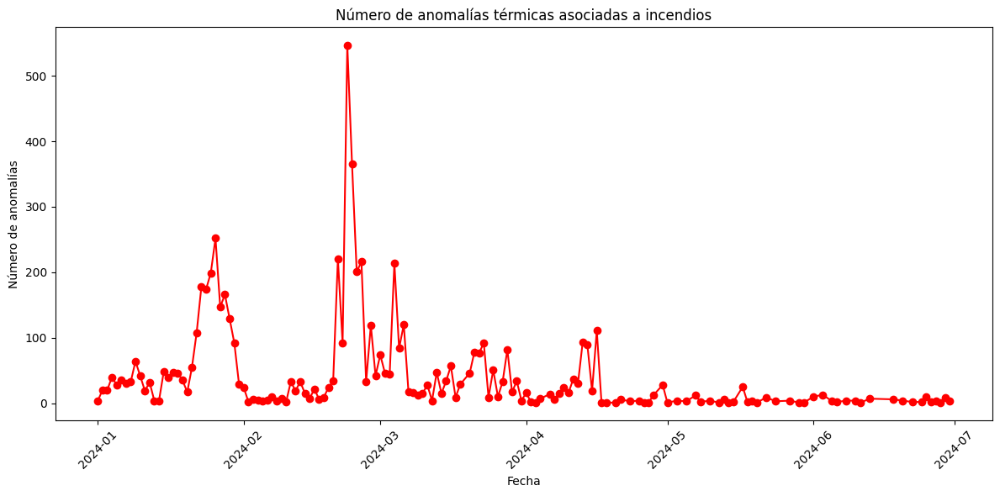

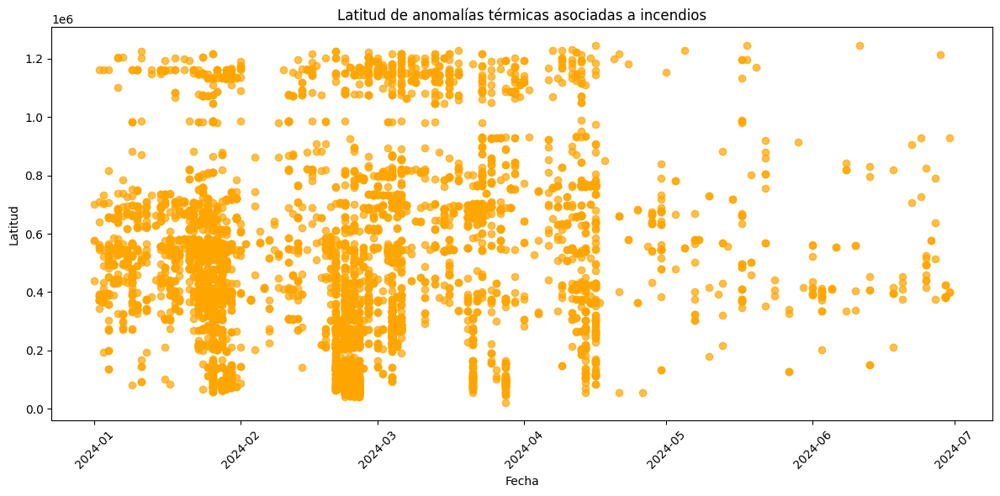

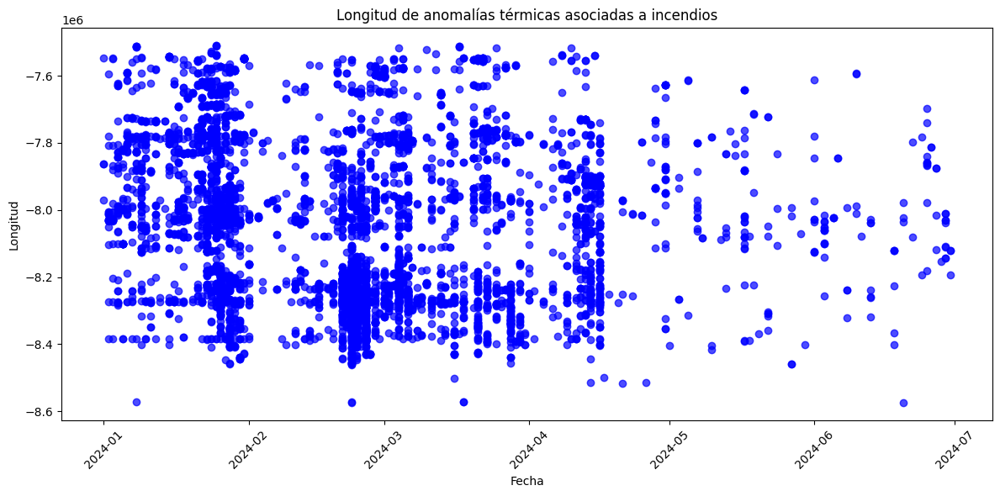

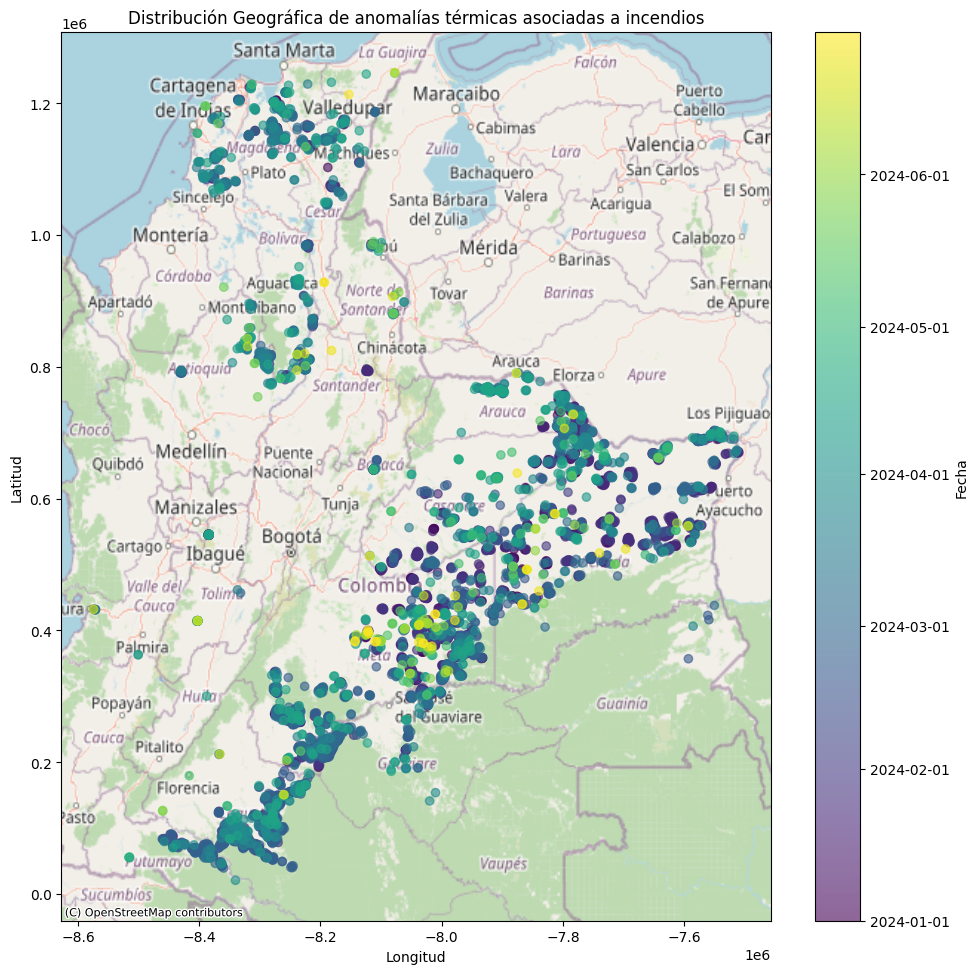

In [8]:
# Codigo para usar el modelo entrenado de IA para la detección de incendios

import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import contextily as ctx
from shapely.geometry import Point
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from datetime import timedelta

# Paso 1: Cargar el modelo entrenado (xgb_model) y el archivo de validación
validation_shapefile_path = 'modis_nrt_para_deteccion.shp'
validation_gdf = gpd.read_file(validation_shapefile_path)

# Paso 2: Convertir la columna de fechas al formato datetime
validation_gdf['ACQ_DATE'] = pd.to_datetime(validation_gdf['ACQ_DATE'])

# Paso 3: Reproyectar las geometrías a un CRS proyectado adecuado para contextily (EPSG:3857)
validation_gdf = validation_gdf.to_crs(epsg=3857)  # EPSG:3857 es el sistema de coordenadas compatible con contextily

# Paso 4: Crear características de proximidad y recurrencia temporal para el nuevo archivo
features_validation = []

for idx, row in validation_gdf.iterrows():
    # Filtrar puntos que están dentro de un radio de 5 km (proximidad geográfica)
    radius = 5000  # 5 km en metros
    nearby_points = validation_gdf[validation_gdf.geometry.distance(row.geometry) <= radius]

    # Contar cuántos puntos hay en el radio, excluyendo el propio punto
    num_nearby_points = len(nearby_points) - 1

    # Calcular el tiempo de recurrencia (puntos en el último mes)
    date_threshold = row['ACQ_DATE'] - pd.Timedelta(days=30)
    recent_points = nearby_points[nearby_points['ACQ_DATE'] >= date_threshold]
    num_recent_points = len(recent_points) - 1

    # Agregar características: número de puntos cercanos y número de puntos recientes
    features_validation.append([num_nearby_points, num_recent_points])

# Paso 5: Convertir a DataFrame y estandarizar las características con el mismo escalador usado anteriormente
features_validation_df = pd.DataFrame(features_validation, columns=['num_nearby_points', 'num_recent_points'])
scaler = StandardScaler()
features_validation_scaled = scaler.fit_transform(features_validation_df)

# Paso 6: Hacer predicciones usando el modelo entrenado (xgb_model)
y_pred_validation = xgb_model.predict(features_validation_scaled)

# Paso 7: Crear un nuevo GeoDataFrame con los puntos clasificados como incendios (ETIQUETA = 1)
incendios_gdf = validation_gdf[y_pred_validation == 1].copy()  # Usar .copy() para evitar SettingWithCopyWarning

# Convertir la columna de fechas ACQ_DATE al formato de cadena
incendios_gdf.loc[:, 'ACQ_DATE'] = pd.to_datetime(incendios_gdf['ACQ_DATE']).dt.strftime('%Y-%m-%d %H:%M:%S')

# Guardar el nuevo archivo como un GeoPackage, que soporta campos datetime sin restricciones
output_geopackage_path = 'modis_nrt_incendios_detectados.gpkg'
incendios_gdf.to_file(output_geopackage_path, driver="GPKG")

print(f"GeoPackage guardado en: {output_geopackage_path}")

# Paso 8: Generar la gráfica de anomalías de incendios por fecha
# Convertir 'ACQ_DATE' de vuelta a datetime para facilitar el conteo por fecha
incendios_gdf['ACQ_DATE'] = pd.to_datetime(incendios_gdf['ACQ_DATE'])
# Contar el número de incendios por fecha
incendios_por_fecha = incendios_gdf.groupby(incendios_gdf['ACQ_DATE'].dt.date).size()

# Crear la gráfica de número de incendios por fecha
plt.figure(figsize=(12, 6))
plt.plot(incendios_por_fecha.index, incendios_por_fecha.values, marker='o', linestyle='-', color='r')
plt.xlabel('Fecha')
plt.ylabel('Número de anomalías')
plt.title('Número de anomalías térmicas asociadas a incendios')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Paso 9: Graficar Latitud vs Fecha y Longitud vs Fecha
# Extraer latitud y longitud de los puntos clasificados como incendios
incendios_gdf['latitude'] = incendios_gdf.geometry.y
incendios_gdf['longitude'] = incendios_gdf.geometry.x

# Crear la gráfica de latitud vs. fecha
plt.figure(figsize=(12, 6))
plt.scatter(incendios_gdf['ACQ_DATE'], incendios_gdf['latitude'], color='orange', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('Latitud')
plt.title('Latitud de anomalías térmicas asociadas a incendios')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Crear la gráfica de longitud vs. fecha
plt.figure(figsize=(12, 6))
plt.scatter(incendios_gdf['ACQ_DATE'], incendios_gdf['longitude'], color='blue', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('Longitud')
plt.title('Longitud de anomalías térmicas asociadas a incendios')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Paso 10: Graficar Latitud vs Longitud con fondo de mapa base
# Convertir las fechas a valores numéricos para la escala de color
incendios_gdf['date_numeric'] = mdates.date2num(incendios_gdf['ACQ_DATE'])

plt.figure(figsize=(10, 10))
ax = plt.gca()
scatter = ax.scatter(incendios_gdf['longitude'], incendios_gdf['latitude'], 
                     c=incendios_gdf['date_numeric'], cmap='viridis', alpha=0.6)
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.title('Distribución Geográfica de anomalías térmicas asociadas a incendios')

# Añadir mapa base
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Ajuste de la barra de colores para mostrar fechas
cbar = plt.colorbar(scatter, label='Fecha')
cbar.ax.yaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # Formato de fecha
cbar.ax.yaxis.set_major_locator(mdates.MonthLocator())  # Ajuste del intervalo de fechas
plt.tight_layout()
plt.show()
